# WhatsApp Chat Analyser

When chatting on WhatsApp with your friends, have you ever wanted to know -

- the number of messages sent by each of you?
- the words that you use the most?
- most shared website links?
- most used emojis and changes in emoji usage pattern with time?
- your chatting time patterns - hourly, daily and monthly?
- who texts first and the first text in each conversation?

I have! Therefore, I decided to put my recently acquired data analysis skills to use for finding these answers. 

Whatsapp allows you to export any chat into a text file. I am writing this code to read this chat file, parse it, analyse it and get the answers.

# 1. Installing required packages

In [1]:
!pip install emoji
!pip install regex
!pip install wordcloud
!pip install spacy
!pip install plotly==4.8.2
!pip install jupyterlab "ipywidgets>=7.5"
!pip install chart_studio

# 2. Importing libraries

In [2]:
import re
import regex
import pandas as pd
import numpy as np
from datetime import datetime
import time
import emoji
from itertools import islice
from urllib.parse import urlparse
from collections import Counter
import matplotlib.pyplot as plt
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import spacy 
from spacy.lang.en.stop_words import STOP_WORDS
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')
import chart_studio.plotly as py
import plotly.graph_objects as go
import plotly.express as px
from plotly import tools
from plotly.subplots import make_subplots
%matplotlib inline
import plotly.offline as pyo
pyo.init_notebook_mode()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Dell\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# 3. Data Preparation and Cleaning

First, we parse the chat file to create a Pandas DataFrame.

In [3]:
def starts_with_date_and_time(s):
    '''
    Checks if the line starts with a date
    :param s: line from the chat file
    :return: boolean value
    '''
    
    pattern = '^([0-9]+)(\/)([0-9]+)(\/)([0-9]+), ([0-9]+):([0-9][0-9])'
    result = re.match(pattern, s)
    if result:
        return True
    return False

In [4]:
def has_author(s):
    '''
    Checks if the line has an author
    :param s: non-date part of line from the chat file
    :return: boolean value
    '''
    
    patterns = [
        '([\w]+):',                        # First Name
        '([\w]+[\s]+[\w]+):',              # First Name + Last Name
        '([\w]+[\s]+[\w]+[\s]+[\w]+):',    # First Name + Middle Name + Last Name
        '([+]\d{2} \d{5} \d{5}):',         # Mobile Number (India)
        '([+]\d{2} \d{3} \d{3} \d{4}):',   # Mobile Number (US)
        '([\w]+)[\u263a-\U0001f999]+:',    # Name and Emoji              
    ]
    pattern = '^' + '|'.join(patterns)
    result = re.match(pattern, s)
    if result:
        return True
    return False

In [5]:
def get_data_point(line):   
    '''
    Extracts features from a line to create a data point
    :param line: line from the chat file
    :return: date+time, date, time, author, message
    '''
    
    split_line = line.split(' - ') 
    date_time = split_line[0]
    date, time = date_time.split(', ') 
    message = ' - '.join(split_line[1:])
    if has_author(message): 
        split_message = message.split(':') 
        author = split_message[0] 
        message = ':'.join(split_message[1:])
    else:
        author = None
    return date_time, date, time, author, message

In [6]:
parsed_data = [] # List to keep track of data so it can be used by a Pandas dataframe
conversation_path = "C:\whatsapp-chat-analyser\chat-file.txt"
with open(conversation_path, encoding="utf-8") as fp:
    fp.readline() # Skipping first line of the file because contains information related to something about end-to-end encryption
    message_buffer = [] 
    date, time, author = None, None, None
    while True:
        line = fp.readline() 
        if not line: 
            break
        line = line.strip() 
        if starts_with_date_and_time(line): 
            if len(message_buffer) > 0: 
                parsed_data.append([date_time, date, time, author, (' '.join(message_buffer)).strip()]) 
            message_buffer.clear() 
            date_time, date, time, author, message = get_data_point(line) 
            message_buffer.append(message) 
        else:
            message_buffer.append(line)

In [7]:
TIME_FMT = '%d/%m/%Y, %H:%M'
df = pd.DataFrame(parsed_data, columns=['Date_Time', 'Date', 'Time', 'Author', 'Message']) # Initialising a pandas Dataframe.
df["Date_Time"] = pd.to_datetime(df["Date_Time"], format=TIME_FMT)

In [8]:
df.head()

,Date_Time,Date,Time,Author,Message
0,2016-09-28 22:47:00,28/09/2016,22:47,Sahana,"So, what did y'all think about the movie?"
1,2016-09-28 22:56:00,28/09/2016,22:56,Damini,Idk
2,2016-09-28 22:57:00,28/09/2016,22:57,Damini,I can't decide yet!
3,2016-09-28 22:57:00,28/09/2016,22:57,Nitya,Why did they kill her?
4,2016-09-28 22:57:00,28/09/2016,22:57,Sahana,😐😐ughh


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39997 entries, 0 to 39996
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date_Time  39997 non-null  datetime64[ns]
 1   Date       39997 non-null  object        
 2   Time       39997 non-null  object        
 3   Author     39656 non-null  object        
 4   Message    39997 non-null  object        
dtypes: datetime64[ns](1), object(4)
memory usage: 1.5+ MB


In [10]:
df = df.dropna()
authors = df['Author'].unique()
authors = list(authors)
authors

['Sahana',
 'Damini',
 'Nitya',
 'Anu',
 '+91 11111 11111',
 'Maya',
 'Karuna',
 'Shaurya',
 'Sarita',
 'Himanshi',
 'Kashish',
 '+91 22222 22222',
 'Dipika',
 'Harsh',
 'Akira',
 'Vishal',
 'Shiv']

We remove the authors who are inactive in the group chat from the Data Frame.

In [11]:
for author in authors:
    selected_df = df[df['Author']==author]
    if selected_df.shape[0]<10:
        df.drop(selected_df.index, inplace=True)
        
authors = df['Author'].unique()
authors = list(authors)
authors

['Sahana',
 'Damini',
 'Nitya',
 'Anu',
 '+91 11111 11111',
 'Maya',
 'Karuna',
 'Shaurya',
 'Sarita',
 'Himanshi',
 'Kashish',
 '+91 22222 22222',
 'Dipika',
 'Akira']

# 4. Exploratory Data Analysis

In [12]:
def get_emoji(text):
    '''
    Creates a list of emojis used in the text
    :param text: string from which emojis are to be extracted
    :return: list of emojis
    '''
    
    emoji_list = []
    data = regex.findall(r'\X', text)
    for word in data:
        if any(char in emoji.UNICODE_EMOJI for char in word):
            emoji_list.append(word)

    return emoji_list

def get_url(text):
    '''
    Creates a list of urls used in the text
    :param text: string from which urls are to be extracted
    :return: list of urls
    '''
    
    URLPATTERN = r'(https?://\S+)'
    url_list = re.findall(URLPATTERN, text)
    return url_list
    
total_messages = df.shape[0]
media_messages = df[df['Message'] == '<Media omitted>'].shape[0]

df["Emoji"] = df["Message"].apply(get_emoji)
emojis = sum(df["Emoji"].str.len())
df["Emoji_Count"] = df["Emoji"].str.len()

df["Url"] = df["Message"].apply(get_url)
urls = sum(df["Url"].str.len())
df["Url_Count"] = df["Url"].str.len()

df['Line_Count'] = 1

## 4.1. Overall statistics for the chat

In [13]:
print("Chat Stats")
print("Messages: ", total_messages)
print("Media: ", media_messages)
print("Emojis: ", emojis)
print("Urls: ", urls)

Chat Stats
Messages:  39653
Media:  3332
Emojis:  12464
Urls:  914


## 4.2. Individual chat statistics for each author

Now, we split the dataframe into two separate dataframes: 

- `media_messages_df`: Contains media messages
- `messages_df`: Contains text messages

In [14]:
media_messages_df = df[df['Message'] == '<Media omitted>']
messages_df = df.drop(media_messages_df.index)
messages_df = messages_df.reset_index(drop=True)

In [15]:
messages_df['Word_Count'] = messages_df['Message'].str.split().str.len()
messages_df.head()

,Date_Time,Date,Time,Author,Message,Emoji,Emoji_Count,Url,Url_Count,Line_Count,Word_Count
0,2016-09-28 22:47:00,28/09/2016,22:47,Sahana,"So, what did y'all think about the movie?",[],0,[],0,1,8
1,2016-09-28 22:56:00,28/09/2016,22:56,Damini,Idk,[],0,[],0,1,1
2,2016-09-28 22:57:00,28/09/2016,22:57,Damini,I can't decide yet!,[],0,[],0,1,4
3,2016-09-28 22:57:00,28/09/2016,22:57,Nitya,Why did they kill her?,[],0,[],0,1,5
4,2016-09-28 22:57:00,28/09/2016,22:57,Sahana,😐😐ughh,"[😐, 😐]",2,[],0,1,1


In [16]:
fig = px.pie(messages_df, values='Line_Count', names='Author', title='Messages sent')
fig.show()

In [17]:
fig = px.pie(messages_df, values='Word_Count', names='Author', title='Words sent')
fig.show()

In [18]:
avg_word_count_list = []

for author in authors:

    selected_df = messages_df[messages_df['Author']==author]
    line_count = selected_df.shape[0]
    word_count = selected_df['Word_Count'].sum()
    average_word_count = word_count/line_count
    avg_word_count_list.append(average_word_count)
    

In [19]:
fig = px.bar(x=authors, y=avg_word_count_list, labels={'x':'Author', 'y':'Average Word Count'}, title="Average Word Count")
fig.show()

In [20]:
fig = px.pie(media_messages_df, values='Line_Count', names='Author', title='Media Messages sent', 
             labels={'Line_Count':'Media_Count'})
fig.show()

In [21]:
fig = px.pie(messages_df, values='Emoji_Count', names='Author', title='Emojis sent')
fig.show()

In [22]:
fig = px.pie(messages_df, values='Url_Count', names='Author', title='Urls sent')
fig.show()

## 4.3. Most used words

In [23]:
text = " ".join(review for review in messages_df.Message)
total_words = messages_df["Word_Count"].sum()
print ("There are {} words in all the messages.".format(total_words))

There are 171127 words in all the messages.


WordCloud of the entire chat:


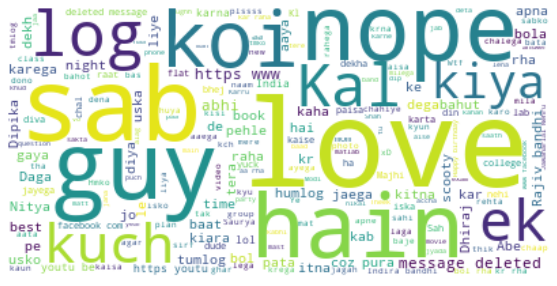

In [24]:
STOP_WORDS |= {"hai", "na", "haa", "haan", "toh", "is", "thi", "arre", "arey", "ye", "ya", "nai", "se", "kya", "mera", "se",
                 "ka", "nahi", "ab", "wala", "tha", "oh", "tumhara", "abi", "aaj", "hum", "okay", "yeah", "acha", "tum", "hum",
                 "hua", "hi", "tumko", "ki", "ko", "woh", "thoda", "bohot", "yeh", "bhi", "aur", "mereko", "tab", "ho", "ok",
                 "wo", "hoga", "humko", "mai", "hota", "ba", "lekin", "hm", "Ye", "kia", "fir", "gya", "tm", "ur"}

text_tokens = word_tokenize(text)
tokens_without_sw = [word for word in text_tokens if not word.lower() in STOP_WORDS]
filtered_sentence = (" ").join(tokens_without_sw)

print("WordCloud of the entire chat:")
wordcloud = WordCloud(background_color="white").generate(filtered_sentence)
plt.figure( figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### WordCloud for each author

WordCloud for Sahana:



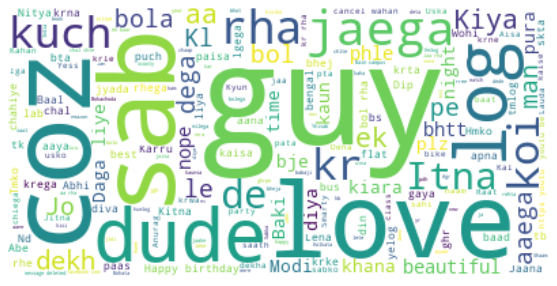


WordCloud for Damini:



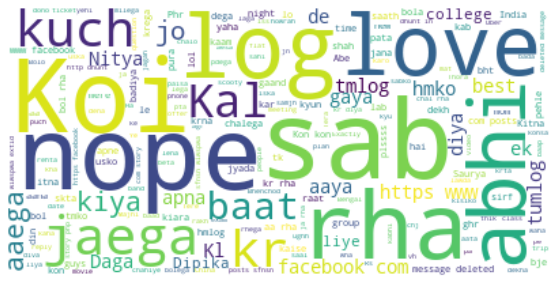


WordCloud for Nitya:



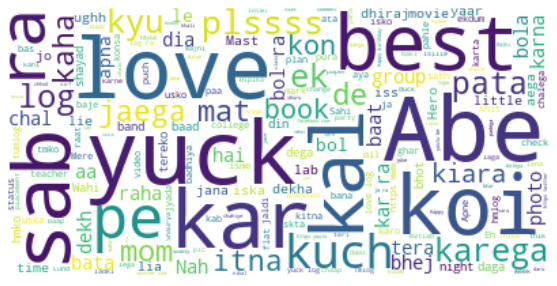


WordCloud for Anu:



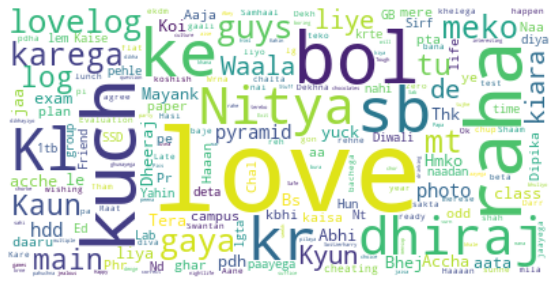


WordCloud for +91 11111 11111:



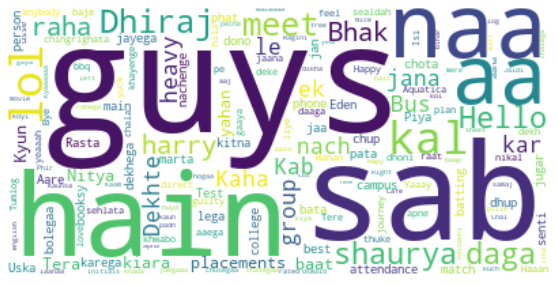


WordCloud for Maya:



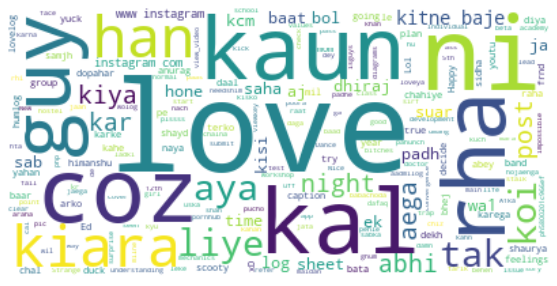


WordCloud for Karuna:



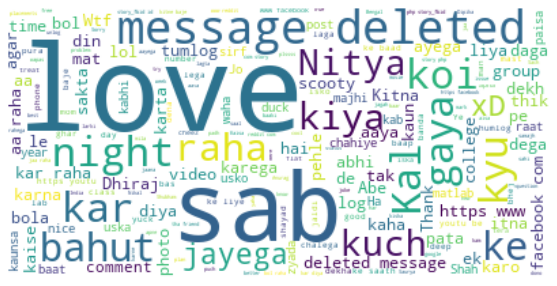


WordCloud for Shaurya:



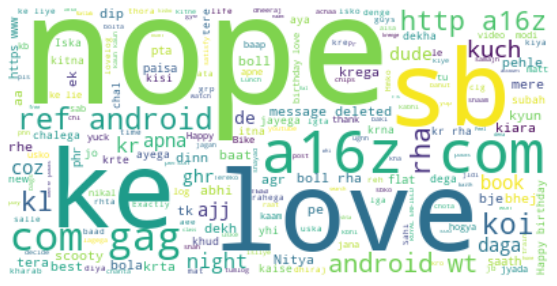


WordCloud for Sarita:



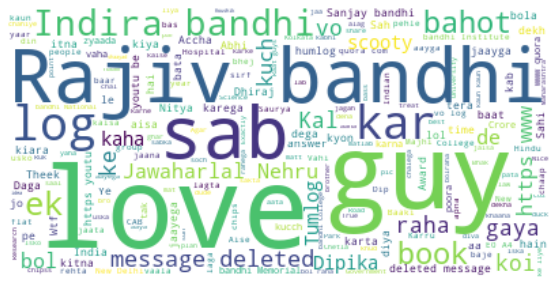


WordCloud for Himanshi:



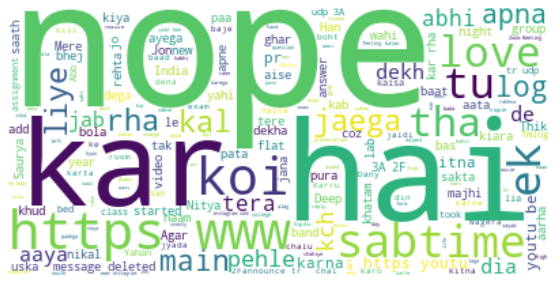


WordCloud for Kashish:



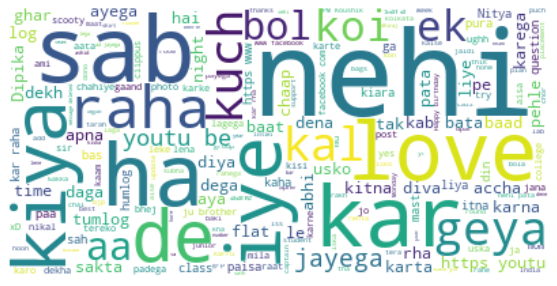


WordCloud for +91 22222 22222:



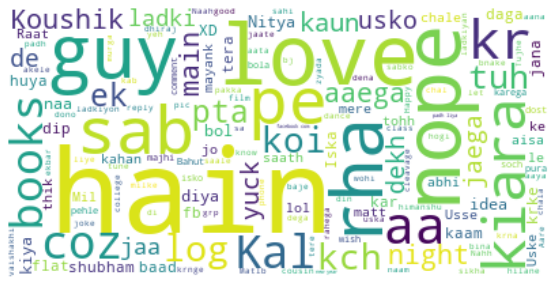


WordCloud for Dipika:



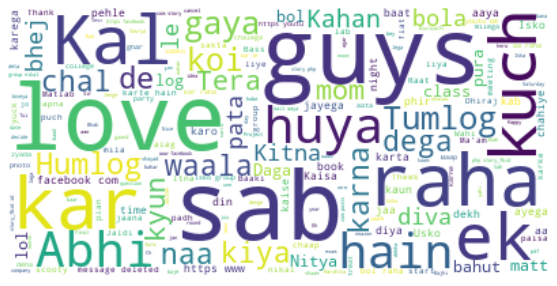


WordCloud for Akira:



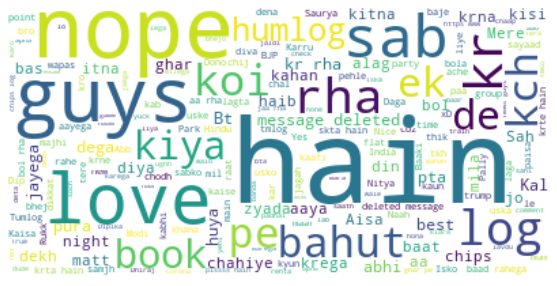

In [25]:
for author in authors:
    selected_df = messages_df[messages_df['Author']==author]
    text = " ".join(review for review in selected_df.Message)
    text_tokens = word_tokenize(text)
    tokens_without_sw = [word for word in text_tokens if not word.lower() in STOP_WORDS]
    filtered_sentence = (" ").join(tokens_without_sw)
    
    print("WordCloud for " + author + ":\n")
    wordcloud = WordCloud(background_color="white").generate(filtered_sentence)
    plt.figure( figsize=(10,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    print()

## 4.4. Top URLs shared by each author

In [26]:
for author in authors:
    selected_df = messages_df[messages_df['Author']==author]
    total_url_list = list([a for url_list in selected_df.Url for a in url_list])
    for i in range(len(total_url_list)):
        url = total_url_list[i].split("//")[-1].split("/")[0].split('?')[0].split('.')
        if len(url)>2:
            url = ".".join(url[1:])
        else:
            url = ".".join(url[0:])
        total_url_list[i] = url
    url_dict = dict(Counter(total_url_list))
    url_dict = sorted(url_dict.items(), key=lambda x: x[1], reverse=True)
    print('URL Distribution for ' + author + ':\n')
    author_url_df = pd.DataFrame(url_dict, columns=['Url', 'Count'])
    author_url_df.loc[author_url_df['Count'] == 1, 'Url'] = 'others'
    fig = px.pie(author_url_df, values='Count', names='Url')
    fig.show()

URL Distribution for Sahana:



URL Distribution for Damini:



URL Distribution for Nitya:



URL Distribution for Anu:



URL Distribution for +91 11111 11111:



URL Distribution for Maya:



URL Distribution for Karuna:



URL Distribution for Shaurya:



URL Distribution for Sarita:



URL Distribution for Himanshi:



URL Distribution for Kashish:



URL Distribution for +91 22222 22222:



URL Distribution for Dipika:



URL Distribution for Akira:



## 4.5. Emoji Distribution

### 4.5.1. By author

In [27]:
MINIMUM_THRESHOLD = 40

for author in authors:
    selected_df = messages_df[messages_df['Author']==author]
    total_emojis_list = list([a for emoji_list in selected_df.Emoji for a in emoji_list])
    emoji_dict = dict(Counter(total_emojis_list))
    emoji_dict = sorted(emoji_dict.items(), key=lambda x: x[1], reverse=True)
    print('Emoji Distribution for ' + author + ':\n')
    author_emoji_df = pd.DataFrame(emoji_dict, columns=['Emoji', 'Count'])
    author_emoji_df.loc[author_emoji_df['Count'] <= MINIMUM_THRESHOLD, 'Emoji'] = 'others'
    fig = px.pie(author_emoji_df, values='Count', names='Emoji')
    fig.update_traces(textposition='inside', textinfo='percent+label')
    fig.show()

Emoji Distribution for Sahana:



Emoji Distribution for Damini:



Emoji Distribution for Nitya:



Emoji Distribution for Anu:



Emoji Distribution for +91 11111 11111:



Emoji Distribution for Maya:



Emoji Distribution for Karuna:



Emoji Distribution for Shaurya:



Emoji Distribution for Sarita:



Emoji Distribution for Himanshi:



Emoji Distribution for Kashish:



Emoji Distribution for +91 22222 22222:



Emoji Distribution for Dipika:



Emoji Distribution for Akira:



### 4.5.2. By month

In [28]:
cols = ['Year', 'Month', 'Emoji', 'Count']
row_list = []

messages_df['Month'] = messages_df.Date_Time.dt.to_period("M")
messages_df['Month'] = messages_df['Month'].dt.strftime('%Y-%m')
months = messages_df['Month'].unique()

for month in months:
    selected_df = messages_df[messages_df['Month']==month]
    total_emojis_list = list([a for emoji_list in selected_df.Emoji for a in emoji_list])
    emoji_dict = dict(Counter(total_emojis_list))
    emoji_dict = sorted(emoji_dict.items(), key=lambda x: x[1], reverse=True)
    emoji_dict = emoji_dict[:3]
    year = month.split("-")[0]
    for emoji_tuple in emoji_dict:
        row_list.append([year, month, emoji_tuple[0], emoji_tuple[1]])
        
emoji_distribution = pd.DataFrame(row_list, columns=cols)
emoji_distribution

,Year,Month,Emoji,Count
0,2016,2016-09,😂,39
1,2016,2016-09,👻,6
2,2016,2016-09,😐,4
3,2016,2016-10,😂,188
4,2016,2016-10,😑,22
...,...,...,...,...
136,2020,2020-06,🤣,59
137,2020,2020-06,🔥,19
138,2020,2020-07,😂,90
139,2020,2020-07,❤️,12


In [29]:
fig = px.sunburst(emoji_distribution, path=['Year', 'Month', 'Emoji'], values='Count',
                  title="Emoji Usage Pattern: Month Over Month")
fig.show()

## 4.6. Chat Distribution

### 4.6.1. By month

In [30]:
per_month = messages_df.Date_Time.dt.to_period("M")
month_df = messages_df.groupby(per_month).sum()

In [31]:
month_df.reset_index(level=0, inplace=True)
month_df['Date_Time'] = month_df['Date_Time'].dt.strftime('%Y-%m')

In [32]:
month_df = month_df.melt(id_vars=["Date_Time"], 
              var_name="Count", 
              value_name="Value")

In [33]:
fig = px.scatter(month_df, x="Date_Time", y="Value", color='Count',
                 title='Chat Distribution: Monthly').update_traces(mode='lines+markers')
fig.show()

### 4.6.2. By hour

In [34]:
per_hour = messages_df['Date_Time'].dt.hour
hour_df = messages_df.groupby(per_hour).sum()
hour_df.reset_index(level=0, inplace=True)
hour_df.rename(columns={"Date_Time":"Hour"}, inplace=True)

In [35]:
hour_df = hour_df.melt(id_vars=["Hour"], 
              var_name="Count", 
              value_name="Value")

In [36]:
fig = px.scatter(hour_df, x="Hour", y="Value", color="Count", range_x=[0,24],
                 title="Chat Distribution: Hourly").update_traces(mode='lines+markers')
fig.show()

### 4.6.3. By day

In [37]:
def day_of_week(i):
    
    day_list = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
    return day_list[i];

day_df=pd.DataFrame(messages_df["Message"])
day_df['Day'] = messages_df['Date_Time'].dt.weekday
day_df.sort_values(by=['Day'], inplace=True)
day_df['Day'] = day_df["Day"].apply(day_of_week)
day_df["Line_Count"] = 1
day_df = day_df.groupby("Day", sort=False).sum()
day_df.reset_index(inplace=True)

In [38]:
fig = px.line_polar(day_df, r='Line_Count', theta='Day', line_close=True, title="Chat Distribution: Daily")
fig.update_traces(fill='toself')
fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0,6000]
    )),
  showlegend=False
)
fig.show()

## 4.7. First texts

First texts are the texts that have been sent by an author after the chat window has been inactive for a time period of T hours.

In [39]:
T = 48
time_prev_str = '07/12/1998, 00:00'
df["Prev_Date"] = df["Date_Time"].shift(1).fillna(datetime.strptime(time_prev_str, TIME_FMT))
df["Time_Diff"] = (df["Date_Time"]-df["Prev_Date"]).astype('timedelta64[h]')

In [40]:
first_text_count = []

for author in authors:
    selected_df = df[df['Author']==author]
    first_text_df = selected_df[selected_df['Time_Diff']>=T]
    first_text_count.append(first_text_df.shape[0])
    print("Number of first texts by " + author + ": ", first_text_df.shape[0])
    print()
    print(first_text_df[['Date', 'Time', 'Message']])
    print()

Number of first texts by Sahana:  4

             Date   Time                                    Message
0      28/09/2016  22:47  So, what did y'all think about the movie?
1636   27/11/2016  17:16                            <Media omitted>
25348  07/08/2019  00:04                                    Woahh 🔥
30408  12/02/2020  12:23                                    UBGPAY7

Number of first texts by Damini:  8

             Date   Time                                            Message
1578   17/11/2016  20:01                                    <Media omitted>
17396  05/06/2018  12:51                           This message was deleted
21157  26/11/2018  18:47                                    <Media omitted>
23488  19/03/2019  17:52  Kiska Kiska confirmation ayaa hai sales force ...
24412  16/05/2019  10:43                                    <Media omitted>
29207  04/01/2020  13:18  https://www.facebook.com/713530748781748/posts...
30635  25/02/2020  02:10  https://www.facebook.com/25

In [41]:
fig = px.bar(x=authors, y=first_text_count, labels={'x':'Author', 'y':'First Text Count'}, title="First Text Count")
fig.show()